In [6]:
import sunpy.map
from aiapy.calibrate import register, update_pointing,normalize_exposure
import astropy.units as u
import scipy
from scipy import ndimage
import matplotlib.pyplot as plt
import sunpy.visualization.colormaps as cm
import numpy as np
import glob
import time
import os
import math
from sunpy.map.maputils import all_coordinates_from_map, coordinate_is_on_solar_disk
import datetime
import plotly.tools as tls

from aia_part.pixel_to_world.std_pixel_to_world import std_pixel_to_world
from aia_part.pixel_to_world.my_pixel_to_world import my_pixel_to_world
from aia_part.calculate_DN import calculate_DN_4096
from aia_part.gaussian_fit_aia import gaussian_fit_aia

from aia_part.data.constant import wavelength_list_aia
from math import pi

In [2]:
aia_adjusted_files=sorted(glob.glob('aia_part/data/AIA/*adjusted.fits'))
aia_adjusted_maps=sunpy.map.Map(aia_adjusted_files)

# AIA_basic
load AIA in Feb 
timeinterval :1h

In [3]:
# aia_path="data/AIA/aia_lev1_304a_2011_02_03t00_00_32_12z_image_lev1.fits"
aia_files = sorted(glob.glob('aia_part/data/AIA/*image_lev1.fits'))
len(aia_files)
# m_aia=sunpy.map.Map(aia_path)
# m_aia

28

In [4]:
start=time.time()

aia_maps=sunpy.map.Map(aia_files)

end=time.time()
total=end-start
print(total)

5.670974254608154


Observatory,SDO
Instrument,AIA 4
Detector,AIA
Measurement,304.0 Angstrom
Wavelength,304.0 Angstrom
Observation Date,2011-02-03 00:04:08
Exposure Time,2.902157 s
Dimension,[4096. 4096.] pix
Coordinate System,helioprojective
Scale,[0.600165 0.600165] arcsec / pix
Reference Pixel,[2053.419922 2036.930054] pix

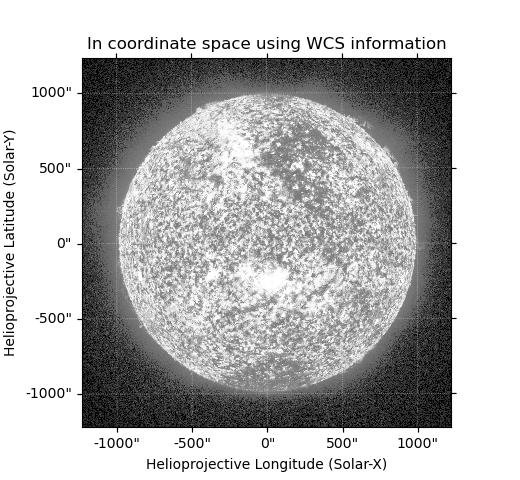
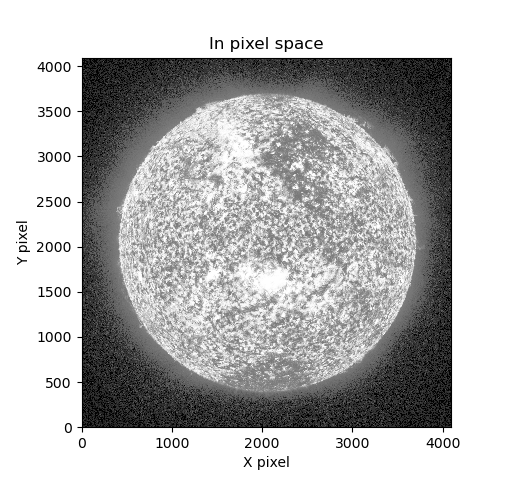
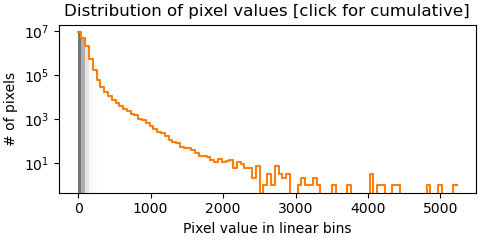
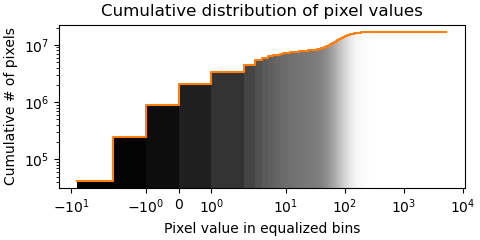

In [11]:
aia_maps[0]

In [12]:
aia_maps[0].meta

MetaDict([('simple', True),
          ('bitpix', 16),
          ('naxis', 2),
          ('naxis1', 4096),
          ('naxis2', 4096),
          ('bld_vers', 'V5R12X'),
          ('lvl_num', 1.0),
          ('t_rec', '2011-02-03T00:04:10Z'),
          ('trecstep', 1.0),
          ('trecepoc', '1977.01.01_00:00:00_TAI'),
          ('trecroun', 1),
          ('origin', 'SDO/JSOC-SDP'),
          ('date', '2012-10-12T22:06:56'),
          ('telescop', 'SDO/AIA'),
          ('instrume', 'AIA_4'),
          ('date-obs', '2011-02-03T00:04:08.12'),
          ('t_obs', '2011-02-03T00:04:09.57Z'),
          ('camera', 4),
          ('img_type', 'LIGHT'),
          ('exptime', 2.902157),
          ('expsdev', 0.0002),
          ('int_time', 3.148438),
          ('wavelnth', 304),
          ('waveunit', 'angstrom'),
          ('wave_str', '304_THIN'),
          ('fsn', 20091030),
          ('fid', 0),
          ('quallev0', 0),
          ('quality', 0),
          ('totvals', 16777216),
          (

In [5]:
aia_maps[0].meta['t_obs']

'2011-02-03T00:04:09.57Z'

In [7]:
dt = datetime.datetime.strptime(aia_maps[0].meta['t_obs'],
                               '%Y-%m-%dT%H:%M:%S.%fZ')
dt

datetime.datetime(2011, 2, 3, 0, 4, 9, 570000)

In [9]:
datetime.datetime.combine(dt.date(), datetime.time.min)

datetime.datetime(2011, 2, 3, 0, 0)

## aiapy level 1.5 processing
https://aiapy.readthedocs.io/en/stable/generated/gallery/prepping_level_1_data.html#sphx-glr-generated-gallery-prepping-level-1-data-py

In [3]:
#用aiapy处理sunpy map 得到 level 1.5 的数据，并存成"_adjusted.fits"

for i in range(len(aia_files)):
    try:
        # Load the original map from a file
        original_map = sunpy.map.Map(aia_files[i])
        
        # Adjust the map using aiapy functions
        adjusted_map = normalize_exposure(register(update_pointing(original_map)))
        
        # Save the adjusted map to a new file
        new_file = aia_files[i].replace('.fits', '_adjusted.fits')
        adjusted_map.save(new_file, overwrite=True)
        
        print(f"Saved adjusted map to {new_file}")

    except:
        print(f"Error  file {aia_files[i]}")


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_03t00_04_08_12z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_04t00_04_08_13z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_05t00_04_08_12z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_06t00_04_08_13z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_07t00_04_08_12z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_08t00_04_08_14z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_09t00_04_08_14z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_10t00_04_08_12z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_11t00_04_08_14z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_12t00_04_08_12z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_13t00_04_08_14z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_14t00_04_08_13z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_15t00_04_08_12z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_16t00_04_08_13z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_17t00_04_08_12z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_18t00_04_08_12z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_19t00_04_08_12z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_20t00_04_08_12z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_21t00_04_08_12z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_22t00_04_08_12z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_23t00_04_08_12z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_24t00_04_08_14z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_25t00_04_08_12z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_26t00_04_08_12z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_27t00_04_08_12z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_02_28t00_04_08_12z_image_lev1_adjusted.fits


Saved adjusted map to data/AIA\aia_lev1_304a_2011_03_01t00_04_08_12z_image_lev1_adjusted.fits
Saved adjusted map to data/AIA\aia_lev1_304a_2011_03_02t00_04_08_13z_image_lev1_adjusted.fits


## aiapy adjusted maps

In [4]:
aia_adjusted_files=sorted(glob.glob('data/AIA/*adjusted.fits'))
len(aia_adjusted_files)

28

Observatory,SDO
Instrument,AIA 4
Detector,AIA
Measurement,304.0 Angstrom
Wavelength,304.0 Angstrom
Observation Date,2011-02-03 00:04:08
Exposure Time,1.0 s
Dimension,[4096. 4096.] pix
Coordinate System,helioprojective
Scale,[0.6 0.6] arcsec / pix
Reference Pixel,[2047.5 2047.5] pix

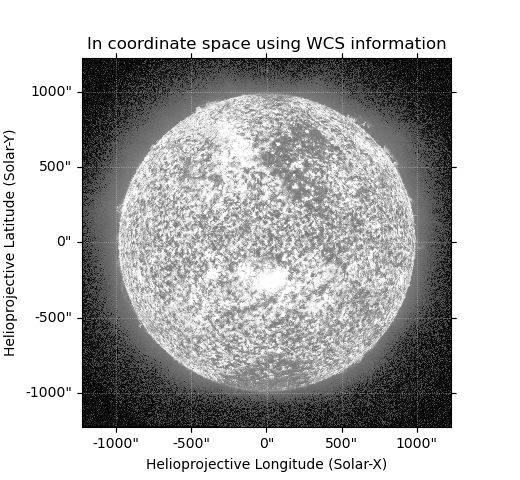
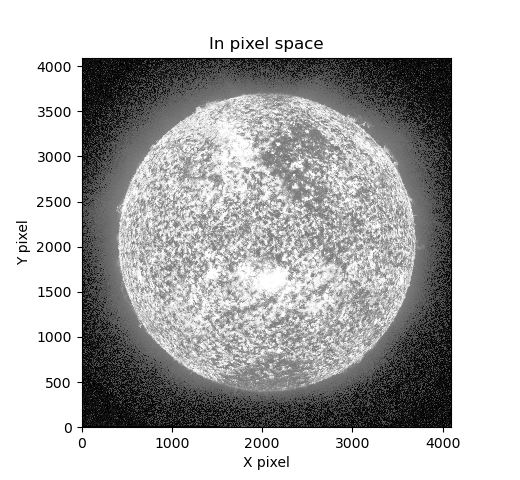
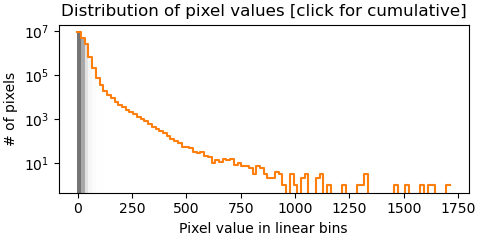
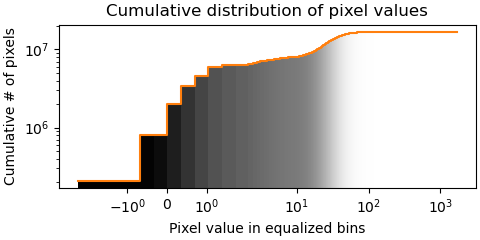

In [5]:
aia_adjusted_maps=sunpy.map.Map(aia_adjusted_files)
aia_adjusted_maps[0]

## pixel_to_world check
经过aiapy校正达到了 level 1.5 ，每个图日面中心在图片中心，每个pixel 0.6 arcsec
就是每个aiapy map 有相同的pixel_to_world 函数

In [65]:
for i in range(len(aia_adjusted_maps)):
    print(std_pixel_to_world(aia_adjusted_maps[i],204.5,247.5))

(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667321824)
(-0.0053610183256379874, -0.005235864667

In [59]:
# map 自带的pixel_to_world 函数很慢
start=time.time()
for i in range(1000):
    std_pixel_to_world(aia_adjusted_maps[0],2047.5,2047.5)
end=time.time()
end-start

3.4497623443603516

In [41]:
std_pixel_to_world(aia_adjusted_maps[0],2047.5,2047.5)
my_pixel_to_world(2047.5,2047.5)

array([-1.65990413e-05,  7.09122684e-05])

In [49]:
aia_adjusted_maps[0].pixel_to_world(2047.5*u.pix,2047.5*u.pix)

<SkyCoord (Helioprojective: obstime=2011-02-03T00:00:08.120, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2011-02-03T00:00:08.120, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-0.01445003, -6.14307676, 1.47426682e+11)>): (Tx, Ty) in arcsec
    (1.5467383e-27, 0.)>

In [60]:
#手动检验日面边缘的点，肉眼观测太阳边缘角半径 985
# metadata中角半径为 974
aia_adjusted_maps[0].pixel_to_world(3690*u.pix,2047*u.pix)

<SkyCoord (Helioprojective: obstime=2011-02-03T00:00:08.120, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2011-02-03T00:00:08.120, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-0.01445003, -6.14307676, 1.47426682e+11)>): (Tx, Ty) in arcsec
    (985.49250119, -0.29999658)>

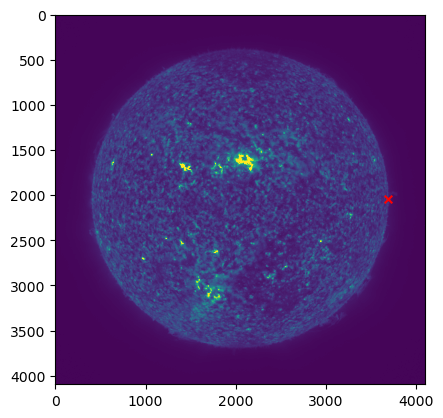

In [57]:
fig,ax = plt.subplots()
ax.imshow(aia_adjusted_maps[0].data,vmax=200)
ax.scatter(3690,2047,marker='x',c='r',s=30)

In [40]:
aia_adjusted_maps[0].meta['rsun_obs']

973.777854

### my pixel to world

In [9]:
my_pixel_to_world(30,30)*3600*180/pi

array([-1210.49123772, -1210.48393322])

In [10]:
aia_adjusted_maps[0].pixel_to_world(30*u.pix,30*u.pix)

<SkyCoord (Helioprojective: obstime=2011-02-03T00:00:08.120, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2011-02-03T00:00:08.120, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-0.01445003, -6.14307676, 1.47426682e+11)>): (Tx, Ty) in arcsec
    (-1210.48610323, -1210.4652589)>

In [12]:
#my_pixel_to_world 速度远远快于map自带的函数
start=time.time()
for i in range(1000):
    my_pixel_to_world(2047.5,2047.5)
end=time.time()
end-start

0.0009961128234863281

## calculate DN

In [ ]:
start=time.time()
for i in range(10):
    a=calculate_DN_4096(aia_adjusted_maps[0])
end=time.time()
total=end-start
total

In [4]:
a=calculate_DN_4096(aia_adjusted_maps[0])
a

array([7.83546751e+07, 2.41017935e+08, 5.95346765e+08, 1.18105734e+09,
       1.88190330e+09, 2.40876535e+09, 2.47689881e+09, 2.04636973e+09,
       1.35852244e+09, 7.24769700e+08, 3.10760364e+08, 1.07098446e+08])

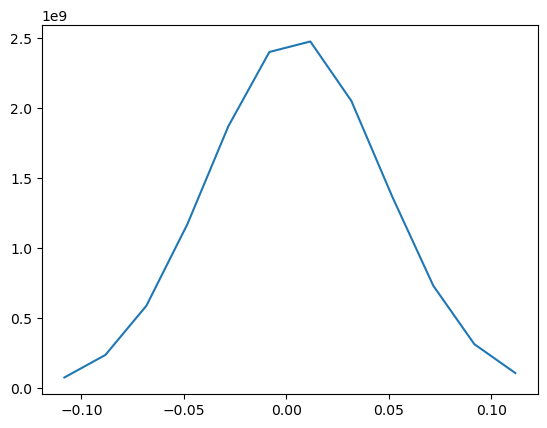

In [7]:
fig,ax=plt.subplots()
ax.plot(wavelength_list,a)

## Gaussian fit

In [5]:
a

array([7.83546751e+07, 2.41017935e+08, 5.95346765e+08, 1.18105734e+09,
       1.88190330e+09, 2.40876535e+09, 2.47689881e+09, 2.04636973e+09,
       1.35852244e+09, 7.24769700e+08, 3.10760364e+08, 1.07098446e+08])

In [7]:
gaussian_fit_aia(wavelength_list_aia,a)

0.004295130055446542

# Visualization of aia maps

### 2011-02-15

In [9]:
hpc_coords = all_coordinates_from_map(aia_adjusted_maps[12])
mask = coordinate_is_on_solar_disk(hpc_coords)

Observatory,SDO
Instrument,AIA 4
Detector,AIA
Measurement,304.0 Angstrom
Wavelength,304.0 Angstrom
Observation Date,2011-02-15 00:04:08
Exposure Time,1.0 s
Dimension,[4096. 4096.] pix
Coordinate System,helioprojective
Scale,[0.6 0.6] arcsec / pix
Reference Pixel,[2047.5 2047.5] pix

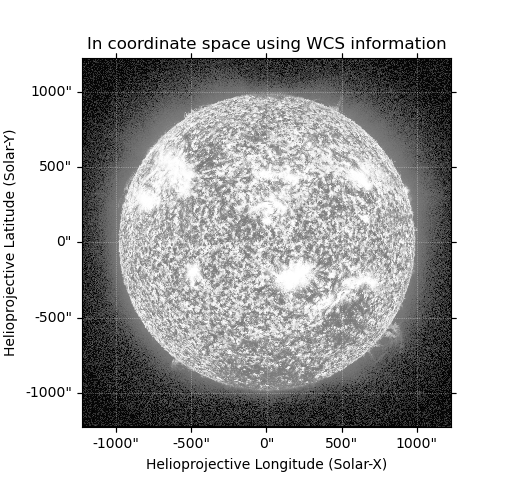
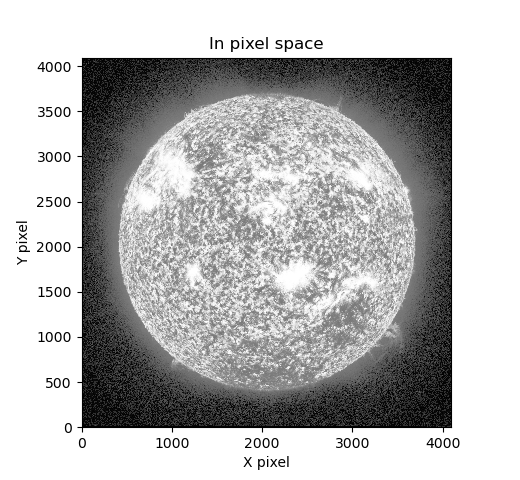
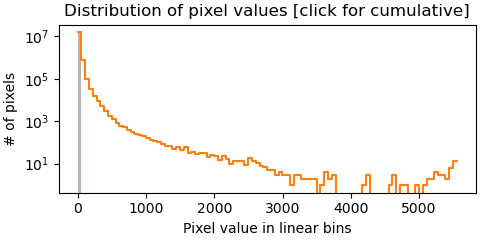
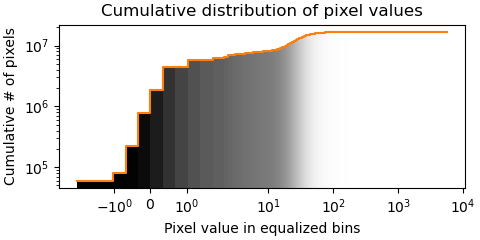

In [10]:
aia_adjusted_maps[12]

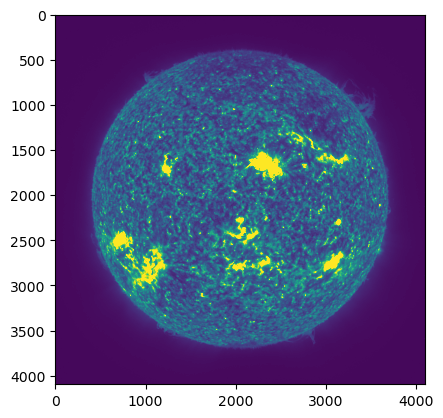

In [11]:
fig, ax = plt.subplots()
ax.imshow(aia_adjusted_maps[12].data,vmax=100)

### 2011-02-28

Observatory,SDO
Instrument,AIA 4
Detector,AIA
Measurement,304.0 Angstrom
Wavelength,304.0 Angstrom
Observation Date,2011-02-28 00:04:08
Exposure Time,1.0 s
Dimension,[4096. 4096.] pix
Coordinate System,helioprojective
Scale,[0.6 0.6] arcsec / pix
Reference Pixel,[2047.5 2047.5] pix

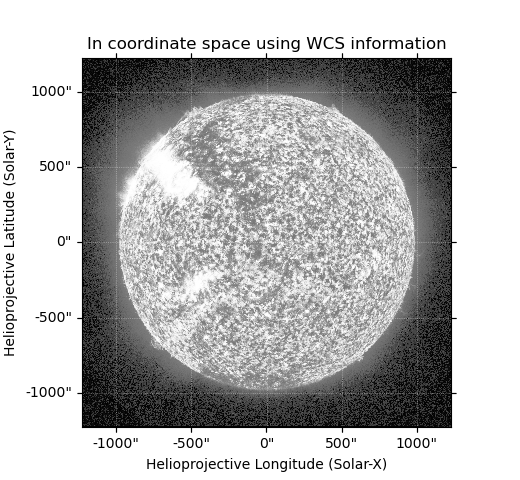
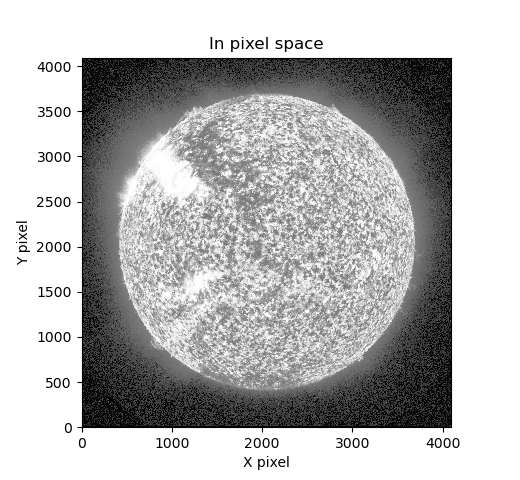
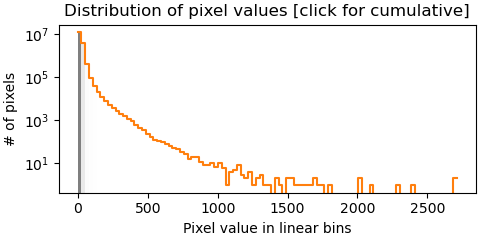
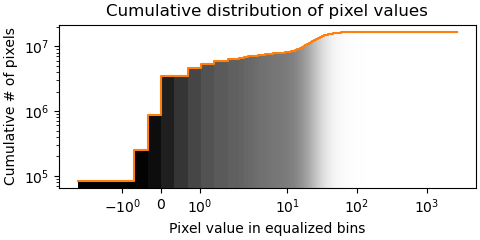

In [12]:
aia_adjusted_maps[25]

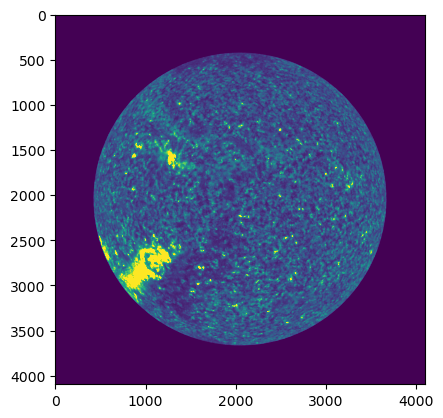

In [13]:
fig, ax = plt.subplots()
ax.imshow(aia_adjusted_maps[25].data*mask,vmax=100)

In [14]:
hpc_coords = all_coordinates_from_map(aia_adjusted_maps[25])
mask1 = coordinate_is_on_solar_disk(hpc_coords)

In [15]:
diff = np.logical_xor(mask, mask1)

In [16]:
diff.sum()/4096**2

0.0028426647186279297

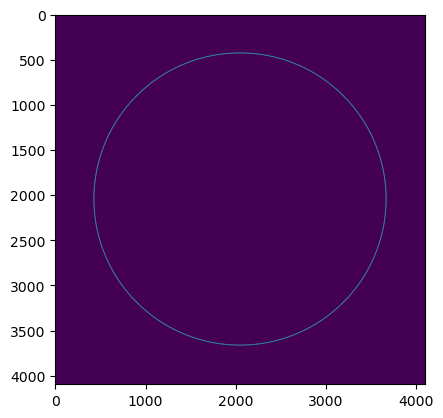

In [17]:
fig, ax = plt.subplots()
ax.imshow(diff)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


145.6554036140442


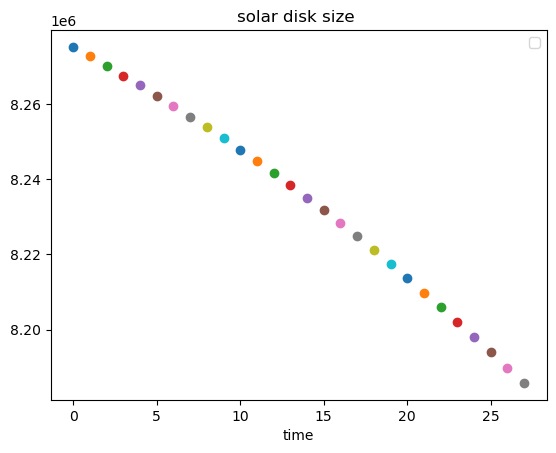

In [18]:
fig, ax = plt.subplots()

start=time.time()

for i in range(len(aia_adjusted_maps)):
    hpc_coords = all_coordinates_from_map(aia_adjusted_maps[i])
    mask = coordinate_is_on_solar_disk(hpc_coords)
    ax.scatter(i,np.sum(mask))
    
ax.set_title('solar disk size ')
ax.set_ylabel("irradiance within AIA FOV")
ax.set_xlabel("time (day)")
ax.legend()
end=time.time()
total=end-start
print(total)


### 近日点/远日点

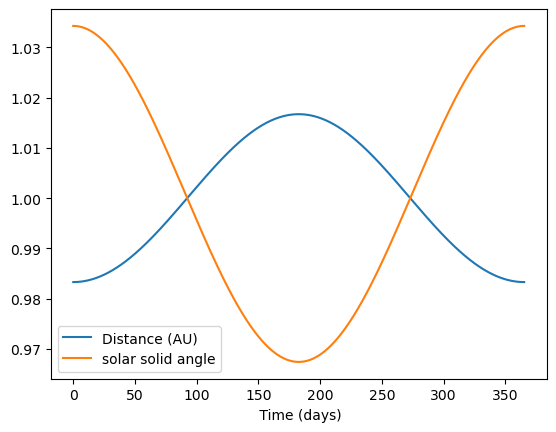

In [79]:
from astropy.constants import au, G, M_sun
# Define the gravitational constant
G = G.value

# Define the mass of the Sun
M_sun = M_sun.value

# Define the semimajor axis of the Earth's orbit
a = au.value

# Define the eccentricity of the Earth's orbit
e = 0.0167

# Define the period of the Earth's orbit in seconds
T = 365.25 * 24 * 3600

# Define an array of times over one year
t = np.linspace(0, T, 1000)

# Calculate the distance between the Earth and the Sun as a function of time
r = a * (1 - e**2) / (1 + e * np.cos(2 * np.pi * t / T))

fig, ax = plt.subplots()

# Plot the distance between the Earth and the Sun as a function of time
ax.plot(t / (24 * 3600), r / au.value,label='Distance (AU)')
ax.plot(t / (24 * 3600), (r / au.value)**(-2),label='solar solid angle') #AIA 看太阳的面积
ax.set_xlabel(' Time (days)')
ax.legend()

In [3]:
len(aia_adjusted_maps)

28

Observatory,SDO
Instrument,AIA 4
Detector,AIA
Measurement,304.0 Angstrom
Wavelength,304.0 Angstrom
Observation Date,2011-02-15 00:04:08
Exposure Time,1.0 s
Dimension,[4096. 4096.] pix
Coordinate System,helioprojective
Scale,[0.6 0.6] arcsec / pix
Reference Pixel,[2047.5 2047.5] pix

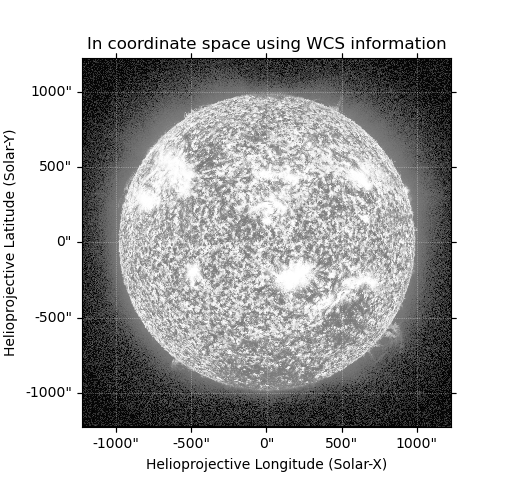
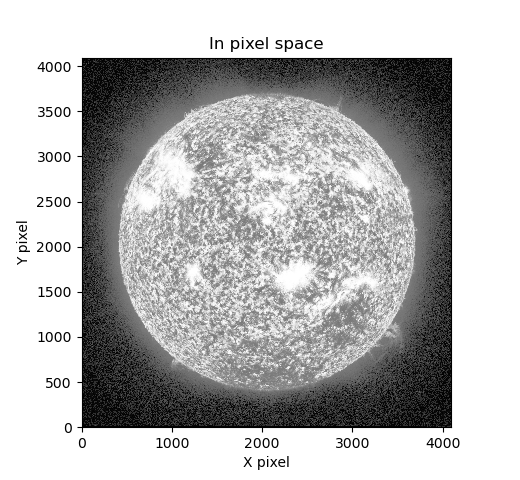
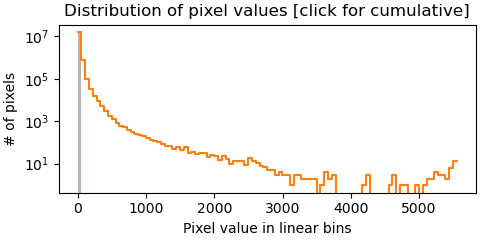
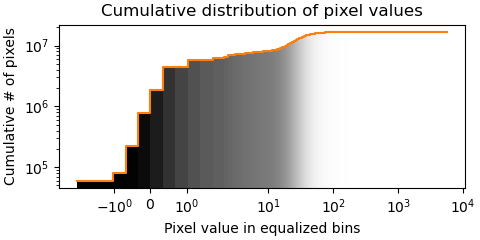

In [4]:
aia_adjusted_maps[12]

In [5]:
aia_adjusted_maps[12].meta['rsun_obs']

971.807989

In [12]:
np.sum(aia_adjusted_maps[12].data>1000)

1430

Observatory,SDO
Instrument,AIA 4
Detector,AIA
Measurement,304.0 Angstrom
Wavelength,304.0 Angstrom
Observation Date,2011-02-25 00:04:08
Exposure Time,1.0 s
Dimension,[4096. 4096.] pix
Coordinate System,helioprojective
Scale,[0.6 0.6] arcsec / pix
Reference Pixel,[2047.5 2047.5] pix

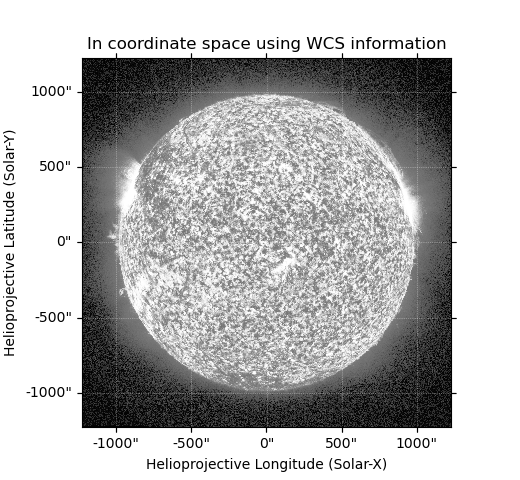
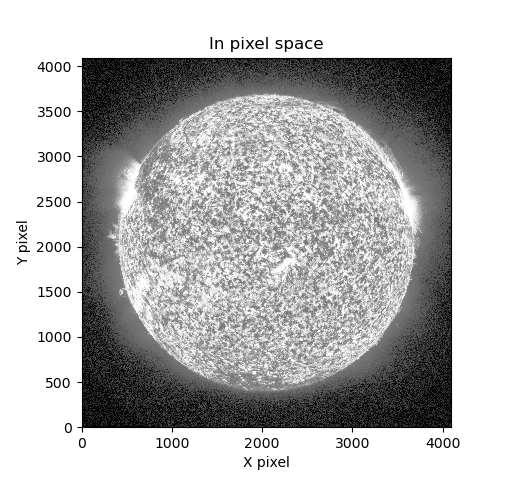
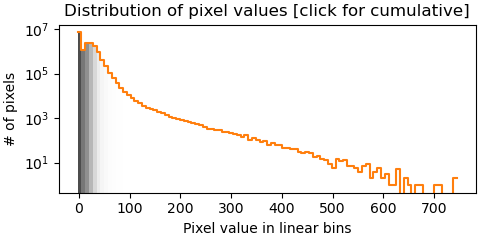
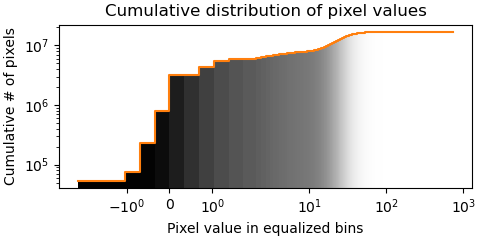

In [8]:
aia_adjusted_maps[22]

In [11]:
np.sum(aia_adjusted_maps[22].data>1000)

0

Text(0.5, 1.0, 'total irradiance')

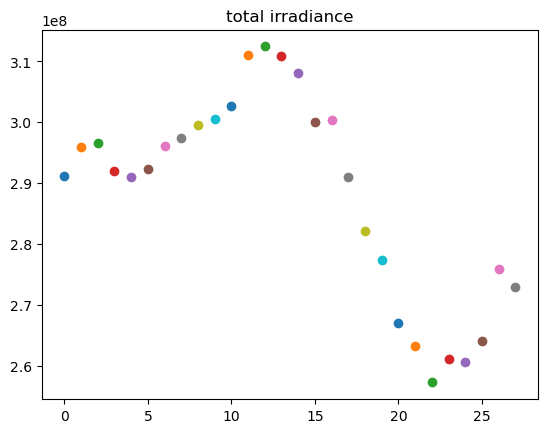

In [26]:
fig, ax = plt.subplots()
for i in range(len(aia_adjusted_maps)):
    ax.scatter(i,np.sum(aia_adjusted_maps[i].data))
    
ax.set_title("total irradiance")

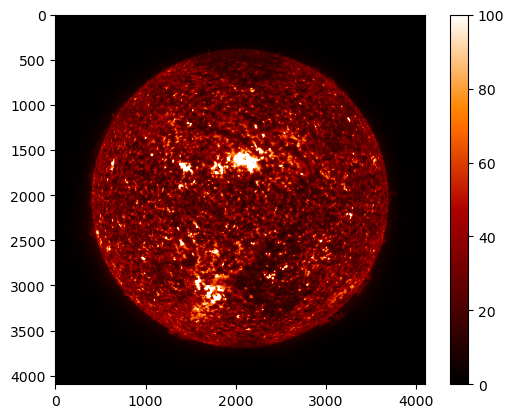

In [61]:
fig, ax = plt.subplots()
sc=ax.imshow(aia_adjusted_maps[0].data,cmap='sdoaia304',vmin=0,vmax=100)
plt.colorbar(sc)

### 一个月的太阳图像

In [3]:
plot_settings=aia_adjusted_maps[0].plot_settings
plot_settings

{'cmap': 'sdoaia304',
 'norm': <astropy.visualization.mpl_normalize.ImageNormalize at 0x2b7e6a262b0>,
 'interpolation': 'nearest',
 'origin': 'lower'}

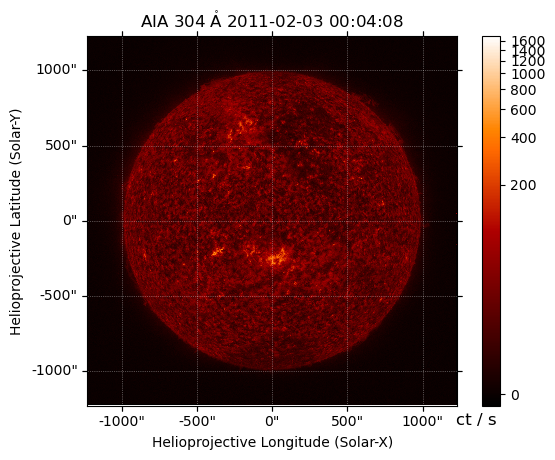

In [21]:
aia_adjusted_maps[0].peek()

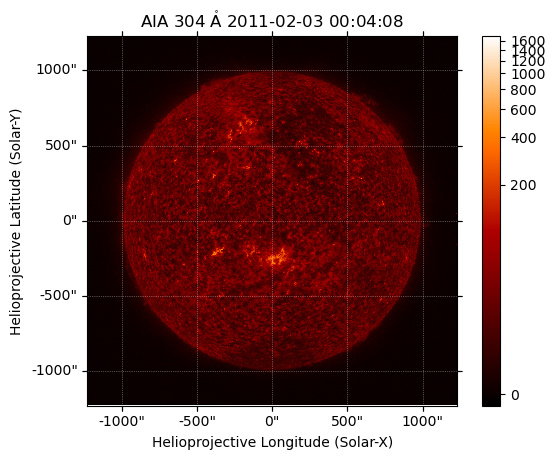

In [4]:
aia_adjusted_maps[0].plot()
# 自动生成 fig,ax
plt.colorbar()

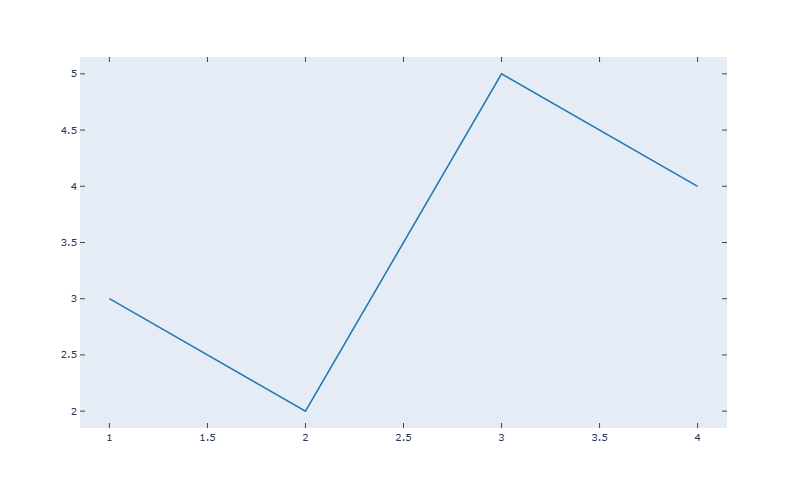

In [15]:
#将简单的matplotlib 的图像转换为
fig,ax = plt.subplots()
ax.plot([1,2,3,4],[3,2,5,4])

# Convert the Matplotlib figure to a Plotly object
plotly_fig = tls.mpl_to_plotly(fig)

# Show the Plotly object
plotly_fig.show()


In [103]:
aspect_ratio = 16/9

# Determine the number of subplots and calculate the number of rows and columns
n_subplots = len(aia_adjusted_maps)
n_cols = min(n_subplots, 2)
n_rows = math.ceil(n_subplots / n_cols)

# Calculate the optimal figure size based on the desired aspect ratio and number of subplots
fig_width = n_cols * 5  # Default width of each subplot is 5 inches
fig_height = fig_width / aspect_ratio * n_rows

# Create the figure with the calculated size
fig = plt.figure(figsize=(fig_width, fig_height))

<Figure size 1000x7875 with 0 Axes>

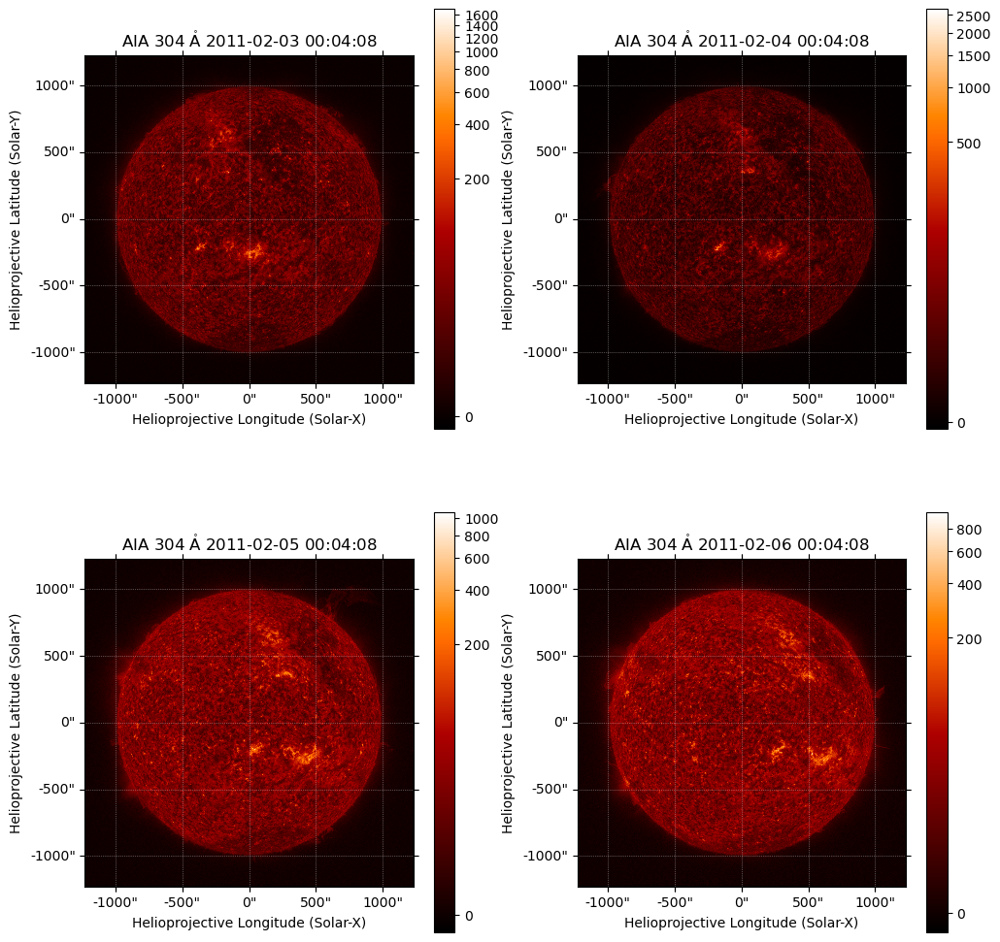

In [26]:
num=4
fig = plt.figure(figsize=(12, 100)) # Set the figure size to 10x5 inches

# for i in range(len(aia_adjusted_maps)):
for i in range(num):
    ax = fig.add_subplot( int(len(aia_adjusted_maps)/2)+1,2, i+1, projection=aia_adjusted_maps[i])
    aia_adjusted_maps[i].plot()
    plt.colorbar()

In [134]:
fig_width

10

In [135]:
fig_height

78.75

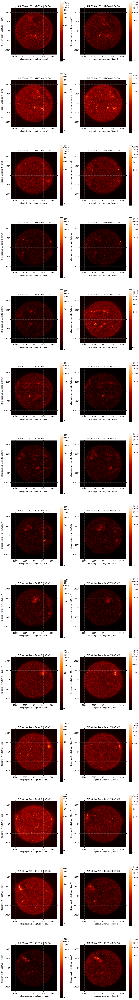

In [29]:
aspect_ratio = 16/9

# Determine the number of subplots and calculate the number of rows and columns
n_subplots = len(aia_adjusted_maps)
n_cols = min(n_subplots, 2)
n_rows = math.ceil(n_subplots / n_cols)

# Calculate the optimal figure size based on the desired aspect ratio and number of subplots
fig_width = n_cols * 6.5  # Default width of each subplot is 5 inches
fig_height = fig_width / aspect_ratio * n_rows

# Create the figure with the calculated size
fig = plt.figure(figsize=(fig_width, fig_height))

for i in range(len(aia_adjusted_maps)):
# for i in range(num):
    ax = fig.add_subplot( n_rows,n_cols, i+1, projection=aia_adjusted_maps[i].wcs)

    aia_adjusted_maps[i].plot(ax)
    plt.colorbar()
    
plt.savefig('aia_part/aia_month.png')

### aia histogram

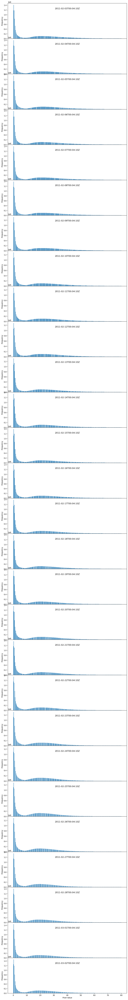

In [35]:
fig, axs = plt.subplots(nrows=len(aia_adjusted_maps),
                        figsize=(12, 100))
fig.subplots_adjust(hspace=0)

for i in range(len(aia_adjusted_maps)):
    
    axs[i].hist(aia_adjusted_maps[i].data.ravel(),bins='auto',range=(0,80));
    axs[i].set_title(aia_adjusted_maps[i].meta['t_rec'],  y=.8)
    axs[i].set_xlabel('Pixel Value')
    axs[i].set_ylabel('Frequency')
 

plt.savefig('aia_part/aia_hist.png')

### circle the active zone

In [39]:
aiamap=sunpy.map.Map(aia_adjusted_files[0])
aiamap_mask=sunpy.map.Map(aia_adjusted_files[0])
mask = aiamap.data < aiamap.max() * 0.10

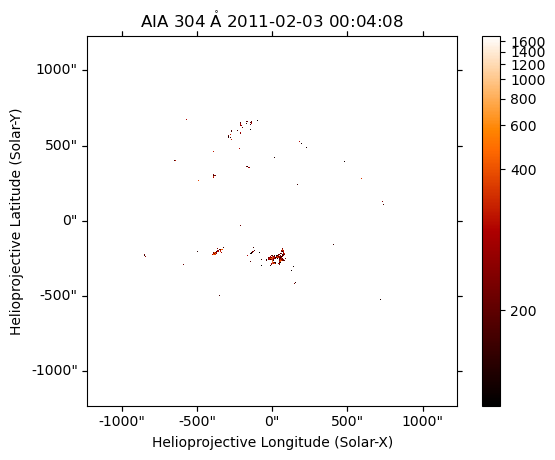

In [40]:
aiamap_mask.mask = mask

plt.figure()
aiamap_mask.plot()
plt.colorbar()

plt.show()

In [35]:
data2 = ndimage.gaussian_filter(aiamap.data * ~mask, 14)

In [36]:
data2[data2 < 100] = 0

In [37]:
aiamap2 = sunpy.map.Map(data2, aiamap.meta)

In [38]:
labels, n = ndimage.label(aiamap2.data)

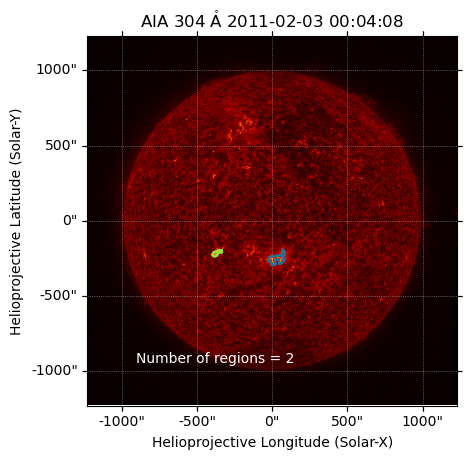

In [39]:
plt.figure()
aiamap.plot()
plt.contour(labels)
plt.figtext(0.3, 0.2, f'Number of regions = {n}', color='white')

plt.show()

#### warp into a function

In [41]:
def plot_az(aiamap,aiamap_mask):
    
    # mask = aiamap.data < aiamap.max() * 0.10

    mask = aiamap.data <60
    aiamap_mask.mask = mask
    
    #拟合
    data2 = ndimage.gaussian_filter(aiamap.data * ~mask, 60)

    data2[data2 < 40] = 0


    aiamap2 = sunpy.map.Map(data2, aiamap.meta)

    labels, n = ndimage.label(aiamap2.data)


    plt.figure()
    sc=aiamap.plot()
    plt.contour(labels)
    plt.colorbar(sc)
    plt.figtext(0.3, 0.2, f'Number of regions = {n}', color='white')

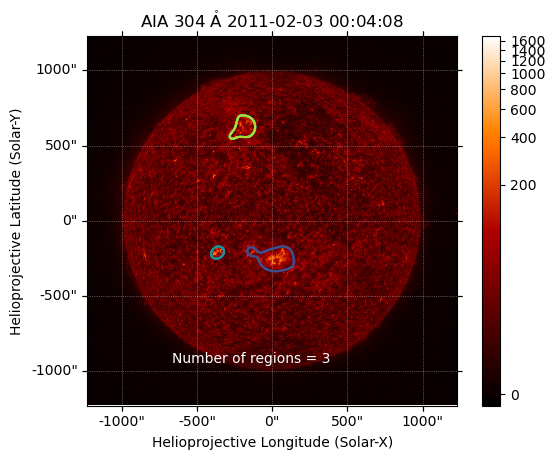

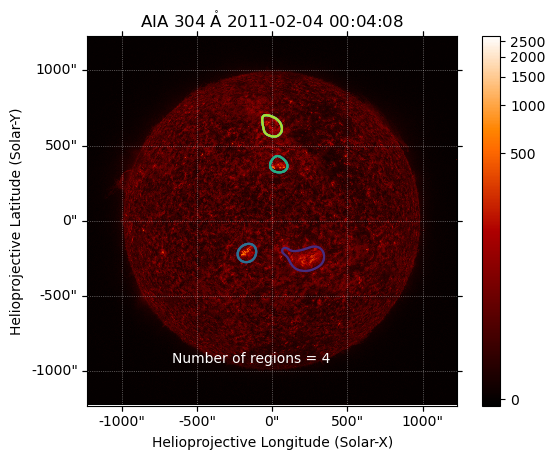

KeyboardInterrupt: 

In [42]:
# fig, axs = plt.subplots(nrows=len(aia_adjusted_maps),)

for i in range(len(aia_adjusted_files)):
    aiamap=sunpy.map.Map(aia_adjusted_files[i])
    aiamap_mask=sunpy.map.Map(aia_adjusted_files[i])
    plot_az(aiamap,aiamap_mask)

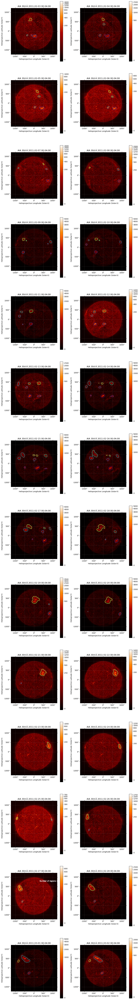

In [3]:
aspect_ratio = 16/9

# Determine the number of subplots and calculate the number of rows and columns
n_subplots = len(aia_adjusted_maps)
n_cols = min(n_subplots, 2)
n_rows = math.ceil(n_subplots / n_cols)

# Calculate the optimal figure size based on the desired aspect ratio and number of subplots
fig_width = n_cols * 6.5  # Default width of each subplot is 5 inches
fig_height = fig_width / aspect_ratio * n_rows

# Create the figure with the calculated size
fig = plt.figure(figsize=(fig_width, fig_height))

for i in range(len(aia_adjusted_maps)):
# for i in range(num):
    ax = fig.add_subplot( n_rows,n_cols, i+1, projection=aia_adjusted_maps[i].wcs)

    
    
    
    aiamap=sunpy.map.Map(aia_adjusted_files[i])
    aiamap_mask=sunpy.map.Map(aia_adjusted_files[i])
    mask = aiamap.data <60
    aiamap_mask.mask = mask
    #拟合
    data2 = ndimage.gaussian_filter(aiamap.data * ~mask, 60)
    data2[data2 < 40] = 0

    aiamap2 = sunpy.map.Map(data2, aiamap.meta)
    labels, n = ndimage.label(aiamap2.data)

    
    sc=aiamap.plot()
    plt.contour(labels)
    plt.colorbar(sc)
    plt.figtext(0.3, 0.2, f'Number of regions = {n}', color='white')
    
plt.savefig('aia_part/az_aia_month.png')